####  Bagging

Bagging Classifier - Accuracy on Training Data: 0.9881093935790726
Bagging Classifier - Accuracy on Testing Data: 0.957345971563981


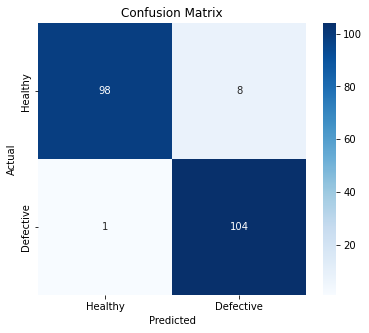

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.92      0.96       106
           1       0.93      0.99      0.96       105

    accuracy                           0.96       211
   macro avg       0.96      0.96      0.96       211
weighted avg       0.96      0.96      0.96       211



  0%|          | 0/50 [00:00<?, ?it/s]

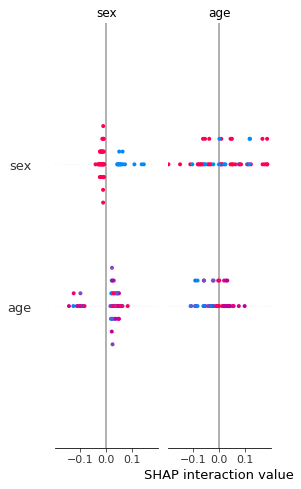

In [1]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier  # Import Bagging
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
# Drop irrelevant columns
x = heart_data.drop(columns=['target'])
y = heart_data['target']

# Normalize the dataset (Not necessary for Bagging, but keeps consistency)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaled, y)

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

# ===================== Initialize Bagging Classifier =====================
bagging_model = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(max_depth=5, random_state=42),  # Use Decision Tree as base model
    n_estimators=50,  # Number of weak learners
    max_samples=0.8,  # Uses 80% of the dataset per estimator
    max_features=0.8,  # Uses 80% of features per estimator
    random_state=42
)

# Train model
bagging_model.fit(x_train, y_train)

# Predictions
train_pred = bagging_model.predict(x_train)
test_pred = bagging_model.predict(x_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, train_pred)
test_accuracy = accuracy_score(y_test, test_pred)

print("Bagging Classifier - Accuracy on Training Data:", train_accuracy)
print("Bagging Classifier - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, test_pred))

# ===================== ✅ SHAP for Explainability (Using KernelExplainer) =====================
explainer = shap.KernelExplainer(bagging_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for ensemble models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)


#### Adaboost

AdaBoost Classifier - Accuracy on Training Data: 0.9120095124851367
AdaBoost Classifier - Accuracy on Testing Data: 0.8957345971563981


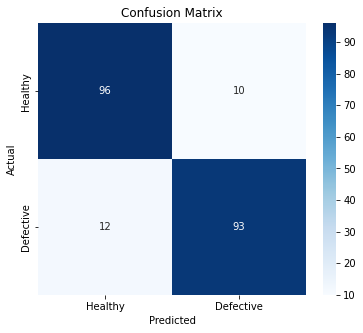

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       106
           1       0.90      0.89      0.89       105

    accuracy                           0.90       211
   macro avg       0.90      0.90      0.90       211
weighted avg       0.90      0.90      0.90       211



  0%|          | 0/50 [00:00<?, ?it/s]

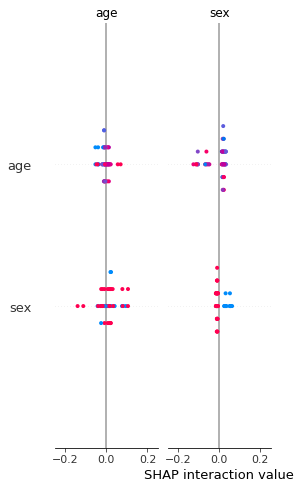

In [3]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier  # Import AdaBoost
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
# Drop irrelevant columns
x = heart_data.drop(columns=['target'])
y = heart_data['target']

# Normalize the dataset (Not necessary for AdaBoost, but keeps consistency)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaled, y)

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

# ===================== Initialize AdaBoost Classifier =====================
adaboost_model = AdaBoostClassifier(
    base_estimator=DecisionTreeClassifier(max_depth=2, random_state=42),  # Weak learner (shallow tree)
    n_estimators=50,  # Number of boosting rounds
    learning_rate=0.1,  # Controls contribution of each weak learner
    random_state=42
)

# Train model
adaboost_model.fit(x_train, y_train)

# Predictions
train_pred = adaboost_model.predict(x_train)
test_pred = adaboost_model.predict(x_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, train_pred)
test_accuracy = accuracy_score(y_test, test_pred)

print("AdaBoost Classifier - Accuracy on Training Data:", train_accuracy)
print("AdaBoost Classifier - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, test_pred))

# ===================== ✅ SHAP for Explainability (Using KernelExplainer) =====================
explainer = shap.KernelExplainer(adaboost_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for ensemble models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)


#### Decison Tree

Decision Tree - Accuracy on Training Data: 0.9346016646848989
Decision Tree - Accuracy on Testing Data: 0.8767772511848341


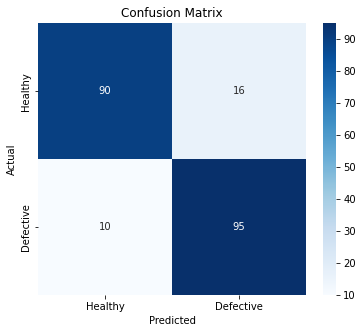

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.85      0.87       106
           1       0.86      0.90      0.88       105

    accuracy                           0.88       211
   macro avg       0.88      0.88      0.88       211
weighted avg       0.88      0.88      0.88       211



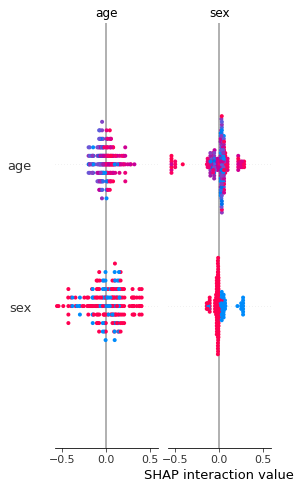

In [4]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier  # Import Decision Tree
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
# Drop irrelevant columns
x = heart_data.drop(columns=['target'])
y = heart_data['target']

# Normalize the dataset (Not necessary for Decision Tree, but keeps consistency)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaled, y)

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

# ===================== Initialize Decision Tree Classifier =====================
dt_model = DecisionTreeClassifier(
    criterion='gini',  # "gini" for Gini impurity, "entropy" for Information Gain
    max_depth=5,       # Limit depth to prevent overfitting
    random_state=42
)

# Train model
dt_model.fit(x_train, y_train)

# Predictions
train_pred = dt_model.predict(x_train)
test_pred = dt_model.predict(x_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, train_pred)
test_accuracy = accuracy_score(y_test, test_pred)

print("Decision Tree - Accuracy on Training Data:", train_accuracy)
print("Decision Tree - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, test_pred))

# ===================== SHAP for Explainability (TreeExplainer for Decision Tree) =====================
explainer = shap.TreeExplainer(dt_model)  # Use TreeExplainer for tree-based models
shap_values = explainer.shap_values(x_test)

# ✅ Fix: Use Class 1 (Heart Disease) if it's a classification task
if isinstance(shap_values, list):  
    shap_values = shap_values[1]  # Select the array corresponding to class 1

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, x_test, feature_names=x.columns)


#### KNN

KNN Classifier - Accuracy on Training Data: 0.9488703923900119
KNN Classifier - Accuracy on Testing Data: 0.8483412322274881


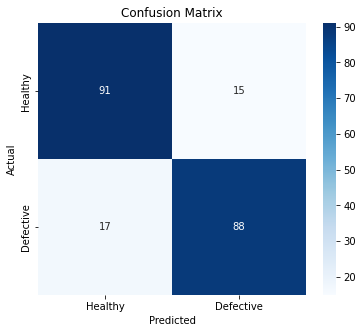

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.86      0.85       106
           1       0.85      0.84      0.85       105

    accuracy                           0.85       211
   macro avg       0.85      0.85      0.85       211
weighted avg       0.85      0.85      0.85       211



  0%|          | 0/50 [00:00<?, ?it/s]

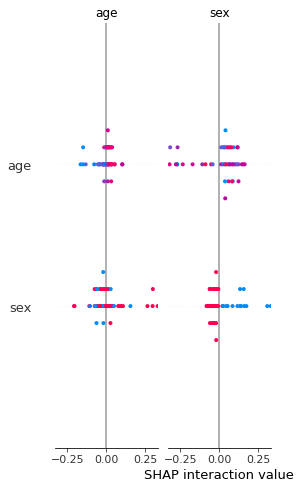

In [5]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier  # Import KNN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
# Drop irrelevant columns
x = heart_data.drop(columns=['target'])
y = heart_data['target']

# Normalize the dataset (KNN requires scaled data)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaled, y)

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

# ===================== Initialize KNN Classifier =====================
knn_model = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2)  # Euclidean distance (p=2)

# Train model
knn_model.fit(x_train, y_train)

# Predictions
train_pred = knn_model.predict(x_train)
test_pred = knn_model.predict(x_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, train_pred)
test_accuracy = accuracy_score(y_test, test_pred)

print("KNN Classifier - Accuracy on Training Data:", train_accuracy)
print("KNN Classifier - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, test_pred))

# ===================== SHAP for Explainability (KernelExplainer for KNN) =====================
explainer = shap.KernelExplainer(knn_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for non-tree models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)


#### Logisitic Regression

Logistic Regression - Accuracy on Training Data: 0.8608799048751486
Logistic Regression - Accuracy on Testing Data: 0.8056872037914692


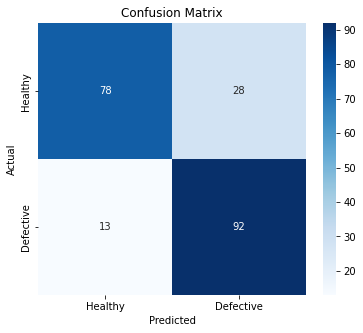

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.74      0.79       106
           1       0.77      0.88      0.82       105

    accuracy                           0.81       211
   macro avg       0.81      0.81      0.80       211
weighted avg       0.81      0.81      0.80       211



  0%|          | 0/50 [00:00<?, ?it/s]

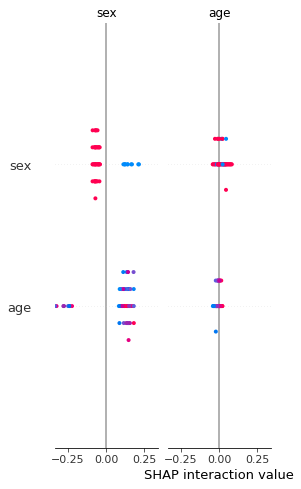

In [6]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression  # Import Logistic Regression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler  # Scaling for better performance

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Standardizing the features (Logistic Regression requires scaled data)
scaler = StandardScaler()
x_resampled = scaler.fit_transform(x_resampled)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# ===================== Initialize Logistic Regression Model =====================
lr_model = LogisticRegression(max_iter=1000, random_state=42)

# Train the model
lr_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = lr_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("Logistic Regression - Accuracy on Training Data:", train_accuracy)

x_test_pred = lr_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("Logistic Regression - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability (KernelExplainer for Logistic Regression) =====================
explainer = shap.KernelExplainer(lr_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for non-tree models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test[i, :], lr_model.predict_proba)
exp.show_in_notebook()


#### Navie Bayes

Naïve Bayes - Accuracy on Training Data: 0.8382877526753865
Naïve Bayes - Accuracy on Testing Data: 0.7819905213270142


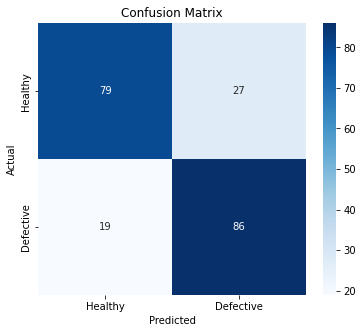

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.75      0.77       106
           1       0.76      0.82      0.79       105

    accuracy                           0.78       211
   macro avg       0.78      0.78      0.78       211
weighted avg       0.78      0.78      0.78       211



  0%|          | 0/50 [00:00<?, ?it/s]

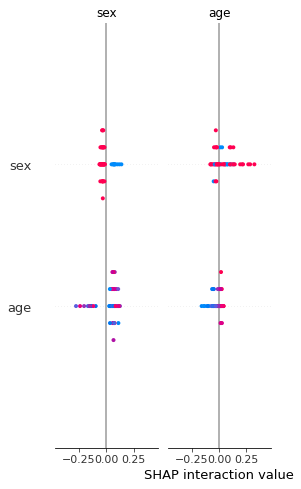

C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [7]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB  # Import Naïve Bayes
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# ===================== Initialize Naïve Bayes Classifier =====================
nb_model = GaussianNB()

# Train the model
nb_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = nb_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("Naïve Bayes - Accuracy on Training Data:", train_accuracy)

x_test_pred = nb_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("Naïve Bayes - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability (Fixed with KernelExplainer) =====================
explainer = shap.KernelExplainer(nb_model.predict_proba, shap.sample(x_train, 100))  # Use KernelExplainer
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test.iloc[i, :], nb_model.predict_proba)
exp.show_in_notebook()


#### Random Forest

Random Forest - Accuracy on Training Data: 0.9500594530321046
Random Forest - Accuracy on Testing Data: 0.9004739336492891


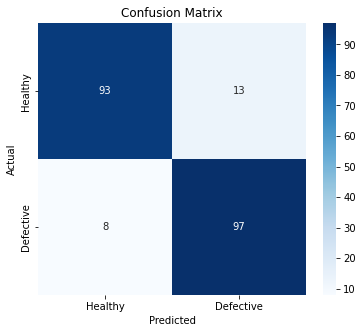

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.88      0.90       106
           1       0.88      0.92      0.90       105

    accuracy                           0.90       211
   macro avg       0.90      0.90      0.90       211
weighted avg       0.90      0.90      0.90       211



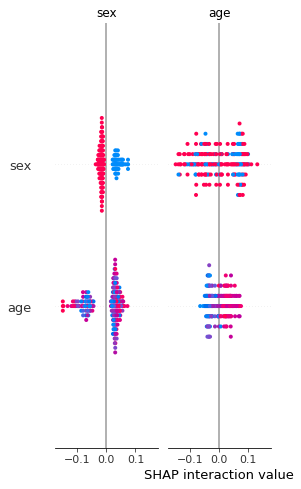

C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [8]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Import Random Forest
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# ===================== Initialize Random Forest Classifier =====================
rf_model = RandomForestClassifier(
    n_estimators=100,  # Number of trees
    max_depth=5,       # Maximum depth of trees
    random_state=42
)

# Train the model
rf_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = rf_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("Random Forest - Accuracy on Training Data:", train_accuracy)

x_test_pred = rf_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("Random Forest - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability (TreeExplainer for Random Forest) =====================
explainer = shap.TreeExplainer(rf_model)  # Use TreeExplainer for tree-based models
shap_values = explainer.shap_values(x_test)

# ✅ Fix: Use Class 1 (Heart Disease) if it's a classification task
if isinstance(shap_values, list):  
    shap_values = shap_values[1]  # Select the array corresponding to class 1

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, x_test, feature_names=x.columns)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test.iloc[i, :], rf_model.predict_proba)
exp.show_in_notebook()


#### SVM

SVM - Accuracy on Training Data: 0.9631391200951248
SVM - Accuracy on Testing Data: 0.95260663507109


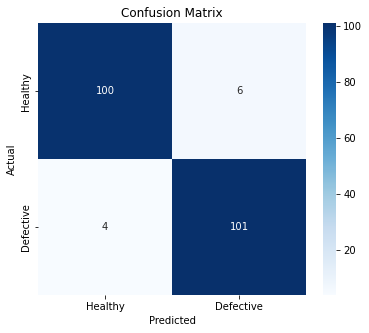

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95       106
           1       0.94      0.96      0.95       105

    accuracy                           0.95       211
   macro avg       0.95      0.95      0.95       211
weighted avg       0.95      0.95      0.95       211



  0%|          | 0/50 [00:00<?, ?it/s]

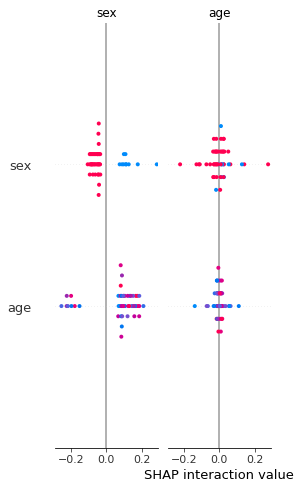

In [9]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC  # Import Support Vector Machine (SVM)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler  # SVM performs better with scaled data

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Standardizing the features (SVM works better with scaled data)
scaler = StandardScaler()
x_resampled = scaler.fit_transform(x_resampled)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# ===================== Initialize SVM Classifier =====================
svm_model = SVC(
    kernel='rbf',  # Radial Basis Function kernel (best for complex decision boundaries)
    C=1.0,         # Regularization parameter (higher values prevent misclassification)
    gamma='scale', # Kernel coefficient
    probability=True,  # Enables probability estimates (needed for LIME & SHAP)
    random_state=42
)

# Train the model
svm_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = svm_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("SVM - Accuracy on Training Data:", train_accuracy)

x_test_pred = svm_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("SVM - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability (KernelExplainer for SVM) =====================
explainer = shap.KernelExplainer(svm_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for non-tree models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test[i, :], svm_model.predict_proba)
exp.show_in_notebook()


#### Voting Classifier

Voting Classifier - Accuracy on Training Data: 0.9239001189060642
Voting Classifier - Accuracy on Testing Data: 0.8909952606635071


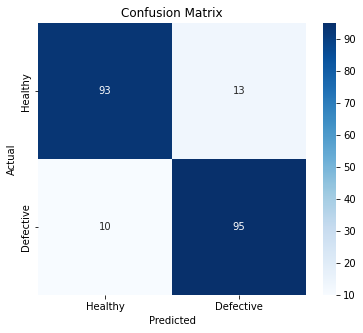

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       106
           1       0.88      0.90      0.89       105

    accuracy                           0.89       211
   macro avg       0.89      0.89      0.89       211
weighted avg       0.89      0.89      0.89       211



  0%|          | 0/50 [00:00<?, ?it/s]

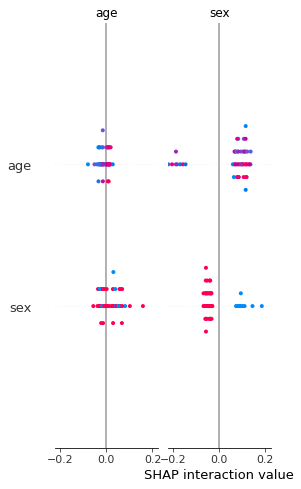

In [10]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier  # Import Voting Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler  # Scaling for better performance

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Standardizing the features (SVM & Logistic Regression perform better with scaled data)
scaler = StandardScaler()
x_resampled = scaler.fit_transform(x_resampled)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# ===================== Initialize Voting Classifier =====================
rf_model = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42)
lr_model = LogisticRegression(max_iter=1000, random_state=42)

voting_model = VotingClassifier(
    estimators=[('RandomForest', rf_model), ('SVM', svm_model), ('LogisticRegression', lr_model)],
    voting='soft'  # Soft voting (averages probabilities)
)

# Train the model
voting_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = voting_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("Voting Classifier - Accuracy on Training Data:", train_accuracy)

x_test_pred = voting_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("Voting Classifier - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability (KernelExplainer for Voting Classifier) =====================
explainer = shap.KernelExplainer(voting_model.predict_proba, shap.sample(x_train, 100))  # KernelExplainer for multiple models
shap_values = explainer.shap_values(shap.sample(x_test, 50))  # Limit to 50 samples for efficiency

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, shap.sample(x_test, 50), feature_names=x.columns)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test[i, :], voting_model.predict_proba)
exp.show_in_notebook()


#### XGBoost

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1025 non-null   int64  
 1   sex       1025 non-null   int64  
 2   cp        1025 non-null   int64  
 3   trestbps  1025 non-null   int64  
 4   chol      1025 non-null   int64  
 5   fbs       1025 non-null   int64  
 6   restecg   1025 non-null   int64  
 7   thalach   1025 non-null   int64  
 8   exang     1025 non-null   int64  
 9   oldpeak   1025 non-null   float64
 10  slope     1025 non-null   int64  
 11  ca        1025 non-null   int64  
 12  thal      1025 non-null   int64  
 13  target    1025 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 112.2 KB


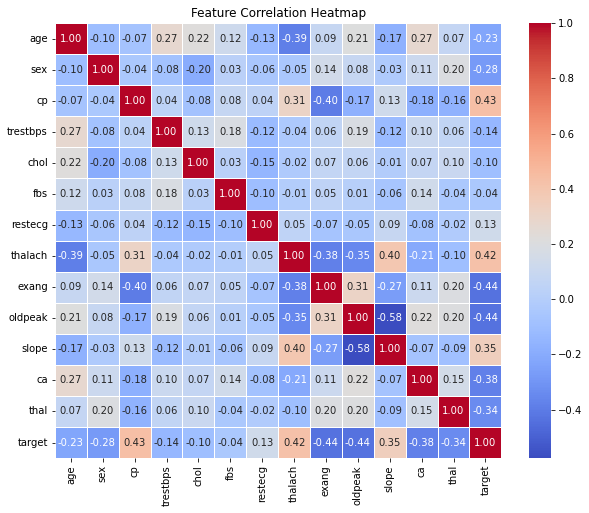

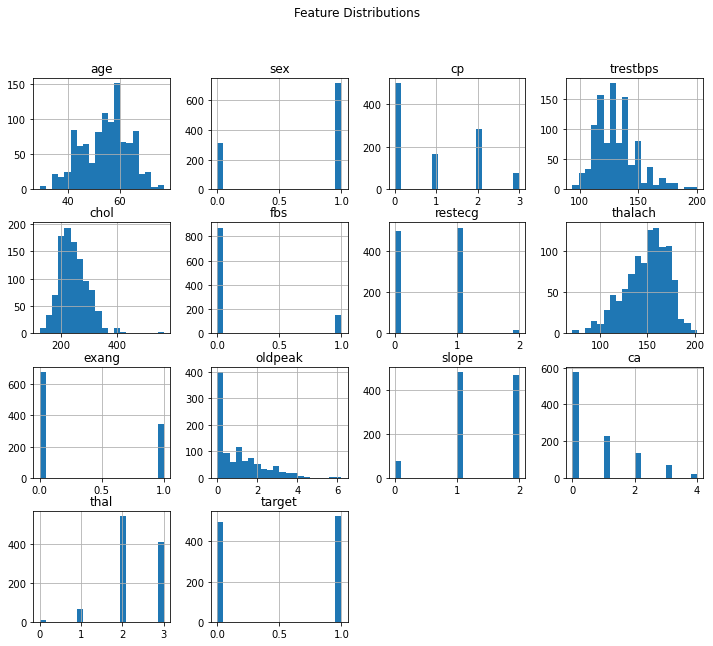

Before SMOTE:
 1    526
0    499
Name: target, dtype: int64
      age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  \
0      52    1   0       125   212    0        1      168      0      1.0   
1      53    1   0       140   203    1        0      155      1      3.1   
2      70    1   0       145   174    0        1      125      1      2.6   
3      61    1   0       148   203    0        1      161      0      0.0   
4      62    0   0       138   294    1        1      106      0      1.9   
...   ...  ...  ..       ...   ...  ...      ...      ...    ...      ...   
1020   59    1   1       140   221    0        1      164      1      0.0   
1021   60    1   0       125   258    0        0      141      1      2.8   
1022   47    1   0       110   275    0        0      118      1      1.0   
1023   50    0   0       110   254    0        0      159      0      0.0   
1024   54    1   0       120   188    0        1      113      0      1.4   

      slope  ca

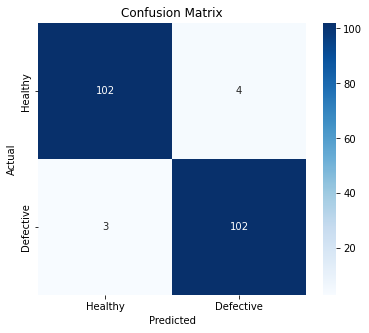

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.96      0.97       106
           1       0.96      0.97      0.97       105

    accuracy                           0.97       211
   macro avg       0.97      0.97      0.97       211
weighted avg       0.97      0.97      0.97       211



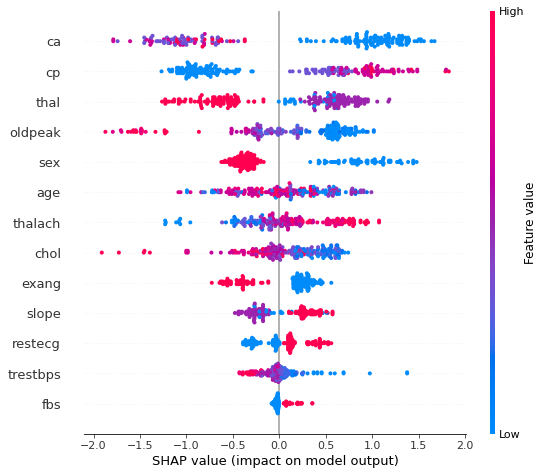

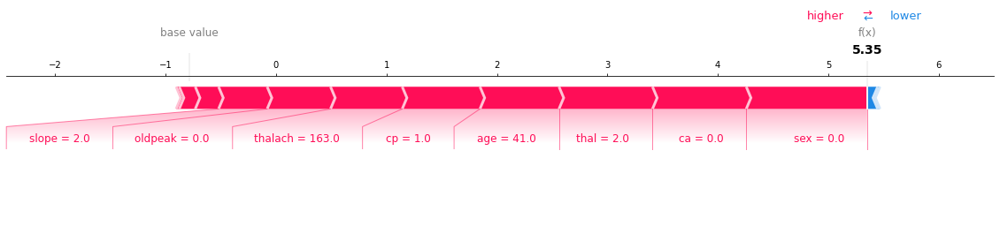

In [11]:
import numpy as np
import pandas as pd
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# print first 5 rows of the dataset
heart_data.head()

# print last 5 rows of the dataset
heart_data.tail()

# The number of rows and columns in the dataset 
heart_data.shape

# Getting some info about the data 
heart_data.info()

# Checking for missing values
heart_data.isnull().sum()

# statistical measures about the data 
heart_data.describe()
# ===================== Data Visualization =====================
# Correlation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(heart_data.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# Histograms of Features
heart_data.hist(figsize=(12, 10), bins=20)
plt.suptitle("Feature Distributions")
plt.show()

# Checking class distribution before applying SMOTE
print("Before SMOTE:\n", heart_data['target'].value_counts())

# Splitting features and target variable
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']
print(x)

print(y)


# Apply SMOTE to balance the dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Checking class distribution after SMOTE
print("After SMOTE:\n", pd.Series(y_resampled).value_counts())

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=2)

# Initialize XGBoost model
xgb_model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1, use_label_encoder=False, eval_metric='logloss')

# Train the model
xgb_model.fit(x_train, y_train)

# Evaluate accuracy
x_train_pred = xgb_model.predict(x_train)
train_accuracy = accuracy_score(y_train, x_train_pred)
print("XGBoost - Accuracy on Training Data:", train_accuracy)

x_test_pred = xgb_model.predict(x_test)
test_accuracy = accuracy_score(y_test, x_test_pred)
print("XGBoost - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, x_test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, x_test_pred))

# ===================== SHAP for Explainability =====================
explainer = shap.Explainer(xgb_model, x_train)  # Initialize SHAP explainer
shap_values = explainer(x_test)  # Compute SHAP values for test set

# ✅ Summary Plot - Global Feature Importance
shap.summary_plot(shap_values, x_test)

# ✅ Corrected Force Plot for a Single Instance
shap.initjs()
shap.force_plot(
    explainer.expected_value,  # Remove indexing [1], use directly
    shap_values.values[0],  # Extract SHAP values for the first instance
    x_test.iloc[0, :],  # Instance features
    matplotlib=True  # Ensures proper rendering in some environments
)

# ===================== LIME for Local Explanation =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    mode="classification",
    feature_names=x.columns.tolist(),
    class_names=["Healthy", "Defective"]
)

# ✅ Explain a single instance using LIME
i = 0  # Choose an instance index
exp = explainer_lime.explain_instance(x_test.iloc[i, :], xgb_model.predict_proba)
exp.show_in_notebook()


#### MLPClassifier

MLP Classifier - Accuracy on Training Data: 0.9940546967895363
MLP Classifier - Accuracy on Testing Data: 0.985781990521327


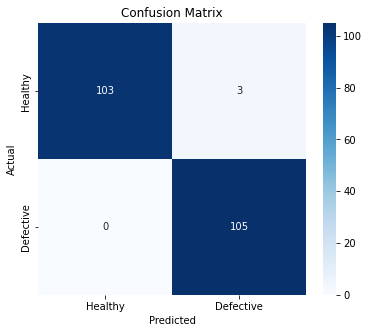

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.99       106
           1       0.97      1.00      0.99       105

    accuracy                           0.99       211
   macro avg       0.99      0.99      0.99       211
weighted avg       0.99      0.99      0.99       211



In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load dataset
heart_data = pd.read_csv('heart.csv')

# ===================== Data Preprocessing =====================
# Drop irrelevant columns
x = heart_data.drop(columns=['target'])
y = heart_data['target']

# Normalize the dataset (MLP requires scaled data)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply SMOTE to balance dataset
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaled, y)

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

# ===================== Optimized MLP Classifier =====================
mlp_model = MLPClassifier(
    hidden_layer_sizes=(1024, 512, 256, 128),  # Deeper architecture
    activation='relu',  # Best for deep learning
    solver='adam',  # Adam optimizer
    alpha=0.0001,  # L2 regularization
    batch_size=32,
    learning_rate='adaptive',
    learning_rate_init=0.00005,  # Lower learning rate
    max_iter=100000,  # More iterations
    early_stopping=True,  # Stops when validation loss stops improving
    random_state=42
)

# Train model
mlp_model.fit(x_train, y_train)

# Predictions
train_pred = mlp_model.predict(x_train)
test_pred = mlp_model.predict(x_test)

# Evaluate accuracy
train_accuracy = accuracy_score(y_train, train_pred)
test_accuracy = accuracy_score(y_test, test_pred)

print("MLP Classifier - Accuracy on Training Data:", train_accuracy)
print("MLP Classifier - Accuracy on Testing Data:", test_accuracy)

# ===================== Confusion Matrix =====================
conf_matrix = confusion_matrix(y_test, test_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["Healthy", "Defective"], yticklabels=["Healthy", "Defective"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
print("Classification Report:\n", classification_report(y_test, test_pred))


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE

# Load dataset
heart_data = pd.read_csv("heart.csv")

# Display dataset information
print("First 5 Rows:\n", heart_data.head())
print("Last 5 Rows:\n", heart_data.tail())
print("Dataset Shape:", heart_data.shape)
print("Dataset Info:\n", heart_data.info())
print("Missing Values:\n", heart_data.isnull().sum())

# Split features and target
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE for class balancing
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Split dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, random_state=42)

# ===================== Initialize Models =====================
log_reg = LogisticRegression()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
svm = SVC(probability=True)
nb = GaussianNB()
rf = RandomForestClassifier()
bagging = BaggingClassifier(base_estimator=DecisionTreeClassifier(), random_state=42)
adaboost = AdaBoostClassifier()
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
mlp = MLPClassifier(max_iter=500)

# Voting Classifier (Combining Models)
voting = VotingClassifier(estimators=[
    ('lr', log_reg), ('dt', dt), ('knn', knn), ('svm', svm),
    ('nb', nb), ('rf', rf), ('bagging', bagging), ('adaboost', adaboost),
    ('xgb', xgb), ('mlp', mlp)], voting='soft')

# ===================== Train and Evaluate Models =====================
models = [log_reg, dt, knn, svm, nb, rf, bagging, adaboost, xgb, mlp, voting]
model_names = ["Logistic Regression", "Decision Tree", "KNN", "SVM", "Naive Bayes",
               "Random Forest", "Bagging", "AdaBoost", "XGBoost", "MLP", "Voting Classifier"]

for model, name in zip(models, model_names):
    model.fit(x_train, y_train)
    predictions = model.predict(x_test)
    accuracy = accuracy_score(y_test, predictions)
    
    print(f"\n{name} Accuracy: {accuracy:.4f}")
    print(f"{name} Classification Report:\n", classification_report(y_test, predictions))



First 5 Rows:
    age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  \
0   52    1   0       125   212    0        1      168      0      1.0      2   
1   53    1   0       140   203    1        0      155      1      3.1      0   
2   70    1   0       145   174    0        1      125      1      2.6      0   
3   61    1   0       148   203    0        1      161      0      0.0      2   
4   62    0   0       138   294    1        1      106      0      1.9      1   

   ca  thal  target  
0   2     3       0  
1   0     3       0  
2   0     3       0  
3   1     3       0  
4   3     2       0  
Last 5 Rows:
       age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  \
1020   59    1   1       140   221    0        1      164      1      0.0   
1021   60    1   0       125   258    0        0      141      1      2.8   
1022   47    1   0       110   275    0        0      118      1      1.0   
1023   50    0   0       110   254    0     

C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81        94
           1       0.83      0.89      0.86       117

    accuracy                           0.84       211
   macro avg       0.84      0.83      0.84       211
weighted avg       0.84      0.84      0.84       211


Decision Tree Accuracy: 1.0000
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        94
           1       1.00      1.00      1.00       117

    accuracy                           1.00       211
   macro avg       1.00      1.00      1.00       211
weighted avg       1.00      1.00      1.00       211


KNN Accuracy: 0.7630
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.79      0.75        94
           1       0.81      0.74      0.78       117

    accuracy      

C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Voting Classifier Accuracy: 0.9905
Voting Classifier Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99        94
           1       1.00      0.98      0.99       117

    accuracy                           0.99       211
   macro avg       0.99      0.99      0.99       211
weighted avg       0.99      0.99      0.99       211




First 5 Rows:
    age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  \
0   52    1   0       125   212    0        1      168      0      1.0      2   
1   53    1   0       140   203    1        0      155      1      3.1      0   
2   70    1   0       145   174    0        1      125      1      2.6      0   
3   61    1   0       148   203    0        1      161      0      0.0      2   
4   62    0   0       138   294    1        1      106      0      1.9      1   

   ca  thal  target  
0   2     3       0  
1   0     3       0  
2   0     3       0  
3   1     3       0  
4   3     2       0  

Last 5 Rows:
       age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  \
1020   59    1   1       140   221    0        1      164      1      0.0   
1021   60    1   0       125   258    0        0      141      1      2.8   
1022   47    1   0       110   275    0        0      118      1      1.0   
1023   50    0   0       110   254    0   

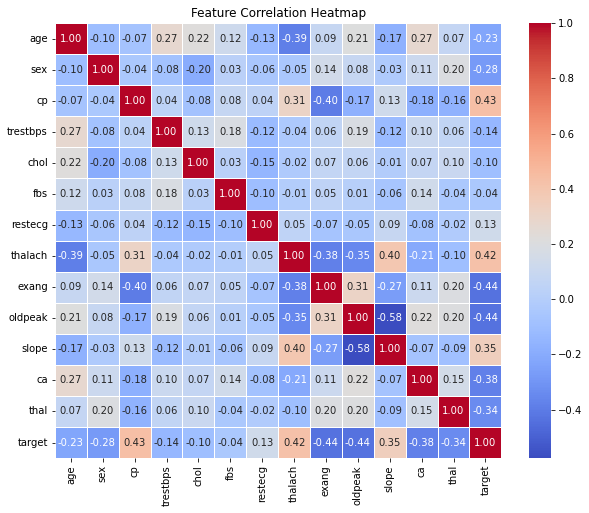


Training Logistic Regression...

Training Decision Tree...

Training KNN...

Training SVM...

Training Naive Bayes...


C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Training Random Forest...

Training Bagging...

Training AdaBoost...

Training XGBoost...

Training MLP...

Training Voting Classifier...


C:\Users\SATISH KUMAR\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Best Model Saved as 'best_heart_disease_model.pkl'

Logistic Regression Accuracy: 0.8389
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.78      0.81        94
           1       0.83      0.89      0.86       117

    accuracy                           0.84       211
   macro avg       0.84      0.83      0.84       211
weighted avg       0.84      0.84      0.84       211


Decision Tree Accuracy: 1.0000
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        94
           1       1.00      1.00      1.00       117

    accuracy                           1.00       211
   macro avg       1.00      1.00      1.00       211
weighted avg       1.00      1.00      1.00       211


KNN Accuracy: 0.7630
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.79    

In [15]:
# ===================== 1) Importing Packages =====================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE
import pickle  # For saving the model

# ===================== 2) Showing the Sample Data =====================
# Load dataset
heart_data = pd.read_csv("heart.csv")

# Display dataset information
print("\nFirst 5 Rows:\n", heart_data.head())
print("\nLast 5 Rows:\n", heart_data.tail())
print("\nDataset Shape:", heart_data.shape)
print("\nDataset Info:\n", heart_data.info())
print("\nMissing Values:\n", heart_data.isnull().sum())

# ===================== 3) Preprocessing =====================
# Splitting features and target
x = heart_data.drop(columns='target', axis=1)
y = heart_data['target']

# Apply SMOTE to handle class imbalance
smote = SMOTE(sampling_strategy='auto', random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)

# Split dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.2, random_state=42)

# ===================== 4) Feature Selection =====================
# Display feature correlations
plt.figure(figsize=(10, 8))
sns.heatmap(heart_data.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# ===================== 5) Model Selection =====================
# Initialize Models
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True),
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(),
    "Bagging": BaggingClassifier(base_estimator=DecisionTreeClassifier(), random_state=42),
    "AdaBoost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    "MLP": MLPClassifier(max_iter=500),
}

# Voting Classifier (Combining Models)
voting = VotingClassifier(estimators=[(name, model) for name, model in models.items()], voting='soft')
models["Voting Classifier"] = voting

# Train and Evaluate Each Model
for name, model in models.items():
    print(f"\nTraining {name}...")
    model.fit(x_train, y_train)
    
# ===================== 6) Saving the Model =====================
# Save the best model (e.g., Voting Classifier)
best_model = models["Voting Classifier"]
with open("best_heart_disease_model.pkl", "wb") as file:
    pickle.dump(best_model, file)
print("\nBest Model Saved as 'best_heart_disease_model.pkl'")

# ===================== 7) Evaluating Performance Metrics =====================
for name, model in models.items():
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"\n{name} Accuracy: {accuracy:.4f}")
    print(f"{name} Classification Report:\n", classification_report(y_test, y_pred))



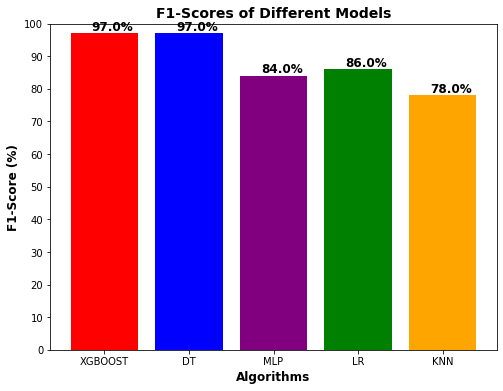

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Sample F1-score values for different models
models = ['XGBOOST', 'DT', 'MLP', 'LR', 'KNN']
F1_scores = [0.97, 0.97, 0.84, 0.86, 0.78]  # F1-scores

# Convert F1-Scores to percentage
F1_scores_percent = [score * 100 for score in F1_scores]

# Assigning different colors to each bar
colors = ['red', 'blue', 'purple', 'green', 'orange']

# Creating the vertical bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(models, F1_scores_percent, color=colors)

# Adding percentage labels on top of each bar
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2 - 0.15,  # X-position
             bar.get_height() + 1,  # Y-position
             f"{bar.get_height():.1f}%",  # Label text
             fontsize=12, fontweight='bold')

# Formatting axes
plt.ylim(0, 100)  # Limit y-axis to 100%
plt.yticks(np.arange(0, 110, 10))  # Y-axis values in 10% intervals
plt.xlabel("Algorithms", fontsize=12, fontweight='bold')
plt.ylabel("F1-Score (%)", fontsize=12, fontweight='bold')
plt.title("F1-Scores of Different Models", fontsize=14, fontweight='bold')

# Show the graph
plt.show()


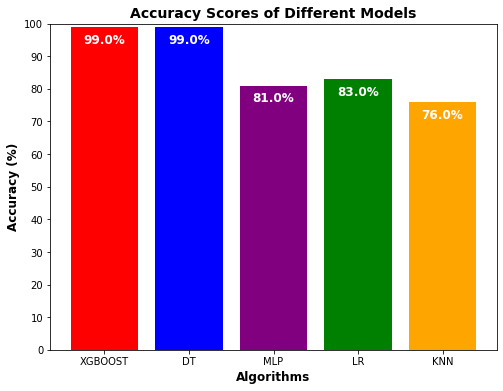

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Sample accuracy values for different models
models = ['XGBOOST', 'DT', 'MLP', 'LR', 'KNN']
accuracy_scores = [0.99, 0.99, 0.81, 0.83, 0.76]  # Accuracy scores

# Convert accuracy scores to percentage
accuracy_percent = [score * 100 for score in accuracy_scores]

# Assigning different colors to each bar
colors = ['red', 'blue', 'purple', 'green', 'orange']

# Creating the vertical bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(models, accuracy_percent, color=colors)

# Adding percentage labels inside the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,  # X-position (center of bar)
             height - 5,  # Y-position (inside the bar, slightly below top)
             f"{height:.1f}%",  # Label text
             fontsize=12, fontweight='bold', ha='center', color='white')  # White text for visibility

# Formatting axes
plt.ylim(0, 100)  # Limit y-axis to 100%
plt.yticks(np.arange(0, 110, 10))  # Y-axis values in 10% intervals
plt.xlabel("Algorithms", fontsize=12, fontweight='bold')
plt.ylabel("Accuracy (%)", fontsize=12, fontweight='bold')
plt.title("Accuracy Scores of Different Models", fontsize=14, fontweight='bold')

# Show the graph
plt.show()


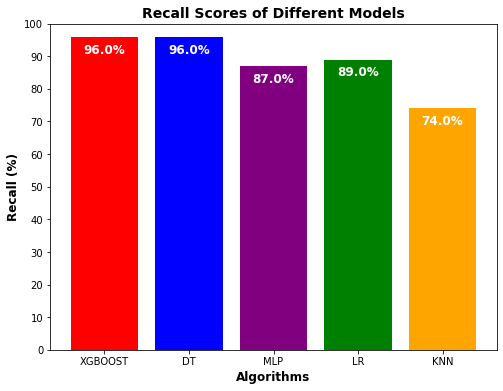

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Sample recall values for different models
models = ['XGBOOST', 'DT', 'MLP', 'LR', 'KNN']
recall_scores = [0.96, 0.96, 0.87, 0.89, 0.74]  # Recall scores

# Convert recall scores to percentage
recall_percent = [score * 100 for score in recall_scores]

# Assigning different colors to each bar
colors = ['red', 'blue', 'purple', 'green', 'orange']

# Creating the vertical bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(models, recall_percent, color=colors)

# Adding percentage labels inside the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,  # X-position (center of bar)
             height - 5,  # Y-position (inside the bar, slightly below top)
             f"{height:.1f}%",  # Label text
             fontsize=12, fontweight='bold', ha='center', color='white')  # White text for visibility

# Formatting axes
plt.ylim(0, 100)  # Limit y-axis to 100%
plt.yticks(np.arange(0, 110, 10))  # Y-axis values in 10% intervals
plt.xlabel("Algorithms", fontsize=12, fontweight='bold')
plt.ylabel("Recall (%)", fontsize=12, fontweight='bold')
plt.title("Recall Scores of Different Models", fontsize=14, fontweight='bold')

# Show the graph
plt.show()


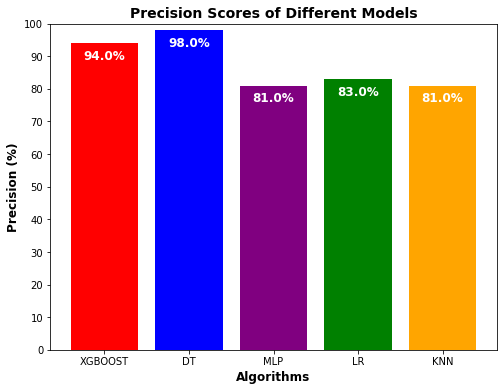

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Sample precision values for different models
models = ['XGBOOST', 'DT', 'MLP', 'LR', 'KNN']
precision_scores = [0.94, 0.98, 0.81, 0.83, 0.81]  # Precision scores

# Convert precision scores to percentage
precision_percent = [score * 100 for score in precision_scores]

# Assigning different colors to each bar
colors = ['red', 'blue', 'purple', 'green', 'orange']

# Creating the vertical bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(models, precision_percent, color=colors)

# Adding percentage labels inside the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,  # X-position (center of bar)
             height - 5,  # Y-position (inside the bar, slightly below top)
             f"{height:.1f}%",  # Label text
             fontsize=12, fontweight='bold', ha='center', color='white')  # White text for visibility

# Formatting axes
plt.ylim(0, 100)  # Limit y-axis to 100%
plt.yticks(np.arange(0, 110, 10))  # Y-axis values in 10% intervals
plt.xlabel("Algorithms", fontsize=12, fontweight='bold')
plt.ylabel("Precision (%)", fontsize=12, fontweight='bold')
plt.title("Precision Scores of Different Models", fontsize=14, fontweight='bold')

# Show the graph
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define methods (algorithms)
methods = ['XGBOOST', 'Decision Tree', 'MLP', 'Logistic Regression', 'KNN']

# Sensitivity (Recall) and Specificity scores for two datasets
# Dataset 1
sensitivity_1 = [85, 78, 82, 88, 80]
specificity_1 = [90, 85, 84, 91, 87]

# Dataset 2
sensitivity_2 = [80, 74, 79, 83, 76]
specificity_2 = [88, 82, 81, 89, 84]

# Bar width and positions
bar_width = 0.35
x = np.arange(len(methods))

# Colors for each dataset
colors = ['blue', 'orange']

# Create figure with two subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 10))

# Sensitivity Plot
axes[0].bar(x - bar_width/2, sensitivity_1, bar_width, label='Dataset 1', color=colors[0])
axes[0].bar(x + bar_width/2, sensitivity_2, bar_width, label='Dataset 2', color=colors[1])
axes[0].set_xticks(x)
axes[0].set_xticklabels(methods)
axes[0].set_ylabel("Sensitivity (%)")
axes[0].set_title("Sensitivity Analysis of Models")
axes[0].legend()

# Specificity Plot
axes[1].bar(x - bar_width/2, specificity_1, bar_width, label='Dataset 1', color=colors[0])
axes[1].bar(x + bar_width/2, specificity_2, bar_width, label='Dataset 2', color=colors[1])
axes[1].set_xticks(x)
axes[1].set_xticklabels(methods)
axes[1].set_ylabel("Specificity (%)")
axes[1].set_title("Specificity Analysis of Models")
axes[1].legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()
